In [1]:
import torch
import torch.optim as optim
import torch.utils.data as Data
import torch.nn.functional as F
import numpy as np
from torch.autograd import Variable
import pandas as pd
import math
from sklearn import preprocessing
import torch
import torch.nn as nn
import torch.nn.functional as F
import pylab
import matplotlib.pyplot as plt

In [52]:
class autoencoder(nn.Module):
    def __init__(self):
        super(autoencoder,self).__init__()
        self.encoder=nn.Sequential(
            nn.Linear(89,32),
            nn.ReLU(),
            nn.Linear(32,16),
            nn.ReLU(),
            nn.Linear(16,4))
        self.decoder=nn.Sequential(
            nn.Linear(4,16),
            nn.ReLU(),
            nn.Linear(16,32),
            nn.ReLU(),
            nn.Linear(32,89),
            nn.Sigmoid())
    def forward(self,x):
        encoded=self.encoder(x)
        decoded=self.decoder(encoded)
        return encoded,decoded

In [3]:
def Loader(path):
    data=np.genfromtxt(path,delimiter=',')
    #delete the first column of the data
    #first column is date info
    data=np.delete(data,0,1)
    #get rid of the tags
    data=data[1:]
    return data


In [4]:
def Normalize(_data):
    dataMin=_data.min(axis=0)
    dataMax=_data.max(axis=0)
    data=(_data-dataMin)/(dataMax-dataMin)
    return data,dataMin,dataMax

def Denormalize(data,dataMin,dataMax):
    return data*(dataMax-dataMin)+dataMin

In [53]:
BATCH_SIZE=16
LR=0.0005
EPOCHS=100
raw_data=Loader('Plastics_and_Chemicals_Macro.csv')
data,_min,_max=Normalize(raw_data)
data=torch.Tensor(data)

_dataset=Data.TensorDataset(data,data)
test_loader=Data.DataLoader(dataset=_dataset,batch_size=1,shuffle=False)
train_loader=Data.DataLoader(dataset=_dataset,batch_size=BATCH_SIZE,shuffle=True)

In [54]:
model=autoencoder()
optimizer=optim.Adam(model.parameters(),lr=LR)
loss_func=nn.MSELoss()

model.train()
for epoch in range(EPOCHS):
    for index,(x,_) in enumerate(train_loader):
        x=x.view(x.size(0),-1)
        x=Variable(x)
        encoded,decoded=model(x)
        loss=loss_func(decoded,x)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    print("Epoch: [%3d], Loss: %.5f" %(epoch + 1, loss.data))

Epoch: [  1], Loss: 0.06193
Epoch: [  2], Loss: 0.03348
Epoch: [  3], Loss: 0.02468
Epoch: [  4], Loss: 0.01346
Epoch: [  5], Loss: 0.01156
Epoch: [  6], Loss: 0.01658
Epoch: [  7], Loss: 0.00993
Epoch: [  8], Loss: 0.00795
Epoch: [  9], Loss: 0.01256
Epoch: [ 10], Loss: 0.00701
Epoch: [ 11], Loss: 0.00756
Epoch: [ 12], Loss: 0.00878
Epoch: [ 13], Loss: 0.00834
Epoch: [ 14], Loss: 0.00678
Epoch: [ 15], Loss: 0.00685
Epoch: [ 16], Loss: 0.00804
Epoch: [ 17], Loss: 0.00824
Epoch: [ 18], Loss: 0.00763
Epoch: [ 19], Loss: 0.00756
Epoch: [ 20], Loss: 0.00957
Epoch: [ 21], Loss: 0.00877
Epoch: [ 22], Loss: 0.01053
Epoch: [ 23], Loss: 0.00528
Epoch: [ 24], Loss: 0.00657
Epoch: [ 25], Loss: 0.00724
Epoch: [ 26], Loss: 0.00867
Epoch: [ 27], Loss: 0.00509
Epoch: [ 28], Loss: 0.00362
Epoch: [ 29], Loss: 0.00625
Epoch: [ 30], Loss: 0.00616
Epoch: [ 31], Loss: 0.00758
Epoch: [ 32], Loss: 0.00626
Epoch: [ 33], Loss: 0.00621
Epoch: [ 34], Loss: 0.00541
Epoch: [ 35], Loss: 0.00609
Epoch: [ 36], Loss: 

In [67]:
model.eval()
reconstruct=[]
for x,_ in test_loader:
    x=x.view(x.size(0),-1)
    x=Variable(x)
    encoded,decoded=model(x)
    tmp=[]
    for x in decoded[0]:
        tmp.append(x)
    reconstruct.append(tmp)

tensor([[0.2941, 0.2977, 0.2993, 0.2992, 0.2467, 0.0582, 0.4611, 0.3198, 0.5065,
         0.2766, 0.6033, 0.0172, 0.5676, 0.5397, 0.0000, 0.2857, 0.1708, 0.4519,
         0.4537, 0.5349, 0.3714, 0.4457, 0.3311, 0.5781, 0.3631, 0.2063, 0.3836,
         0.5083, 0.2730, 0.5593, 0.2718, 0.2725, 0.2729, 0.2712, 0.6812, 0.0021,
         0.1026, 0.4448, 0.8539, 0.0000, 0.0042, 0.0515, 0.9029, 0.7077, 0.0151,
         0.3032, 0.3035, 0.1379, 0.2488, 0.4636, 0.6636, 0.6316, 0.0847, 0.2421,
         0.7825, 0.5467, 1.0000, 0.4716, 0.7500, 0.6295, 0.0274, 0.4444, 1.0000,
         0.4333, 0.2182, 0.6823, 0.7252, 0.9702, 0.7671, 0.5887, 0.5432, 0.6607,
         0.0000, 0.0943, 0.2222, 0.3913, 0.4194, 0.2364, 0.1073, 0.6744, 0.2050,
         0.2130, 0.0000, 0.3235, 0.2002, 0.3684, 0.6403, 0.3066, 0.5663]])
tensor([[0.3024, 0.3013, 0.3055, 0.2954, 0.2191, 0.0582, 0.4153, 0.3177, 0.4504,
         0.2878, 0.5315, 0.0176, 0.4550, 0.5677, 0.0000, 0.2857, 0.1708, 0.4519,
         0.4537, 0.5349, 0.3714, 0

tensor([[0.2932, 0.2979, 0.2978, 0.2953, 0.1541, 0.0954, 0.3896, 0.3362, 0.4547,
         0.1745, 0.4843, 0.0515, 0.4031, 0.6137, 0.0000, 0.3143, 0.2280, 0.4222,
         0.4449, 0.4930, 0.3714, 0.4457, 0.3716, 0.5803, 0.4236, 0.1841, 0.4110,
         0.4846, 0.2606, 0.5237, 0.2766, 0.2727, 0.2730, 0.2663, 0.4669, 0.2870,
         0.1026, 0.3584, 0.9727, 0.0125, 0.0000, 0.0000, 0.8824, 0.7829, 0.0151,
         0.3578, 0.3313, 0.3861, 0.3937, 0.6536, 0.6694, 0.6842, 0.0508, 0.2195,
         0.7674, 0.6400, 0.9048, 0.5407, 0.8125, 0.6295, 0.0000, 0.5111, 1.0000,
         0.4333, 0.1818, 0.6020, 0.6262, 0.9729, 0.7671, 0.9599, 0.5343, 0.5357,
         0.0571, 0.0755, 1.0000, 0.3478, 0.4667, 0.3273, 0.1331, 0.6744, 0.2725,
         0.2876, 0.0135, 0.3044, 0.1920, 0.3529, 0.6398, 0.2938, 0.5293]])
tensor([[0.2955, 0.2930, 0.2968, 0.2895, 0.0914, 0.0934, 0.3381, 0.3354, 0.4647,
         0.1669, 0.4665, 0.0488, 0.3456, 0.6074, 0.0000, 0.3143, 0.2230, 0.4296,
         0.4449, 0.4930, 0.3714, 0

tensor([[0.5225, 0.5240, 0.5042, 0.5160, 0.4912, 0.1715, 0.4605, 0.5712, 0.5007,
         0.1669, 0.4508, 0.1595, 0.4703, 0.6760, 0.2812, 0.3714, 0.2051, 0.5074,
         0.5683, 0.5814, 0.4286, 0.5143, 0.5608, 0.6527, 0.5446, 0.1253, 0.4658,
         0.6271, 0.4108, 0.6405, 0.3824, 0.4065, 0.4218, 0.4108, 0.5024, 0.2807,
         0.0726, 0.5665, 0.9683, 0.0755, 0.0822, 0.2010, 0.7039, 0.6275, 0.2893,
         0.5072, 0.4011, 0.2578, 0.3553, 0.4232, 0.7962, 0.7895, 0.0847, 0.2059,
         0.5846, 0.5200, 0.7143, 0.5185, 0.7083, 0.8138, 0.0320, 0.5778, 1.0000,
         0.3667, 0.3273, 0.5452, 0.6198, 0.8916, 0.6027, 0.8461, 0.6173, 0.4464,
         0.2571, 0.0566, 1.0000, 0.1739, 0.6111, 0.2909, 0.2157, 0.7054, 0.2905,
         0.3024, 0.0464, 0.3781, 0.2283, 0.3951, 0.6251, 0.5647, 0.7185]])
tensor([[0.5277, 0.5338, 0.5370, 0.5306, 0.3085, 0.1727, 0.4442, 0.5741, 0.5050,
         0.1596, 0.4656, 0.1607, 0.4654, 0.6453, 0.2812, 0.3714, 0.2051, 0.5074,
         0.5683, 0.5953, 0.4286, 0

tensor([[0.6215, 0.6360, 0.6357, 0.6273, 0.2938, 0.2304, 0.5527, 0.7360, 0.4705,
         0.0522, 0.5030, 0.2344, 0.5804, 0.6381, 0.5625, 0.6000, 0.2564, 0.5519,
         0.7181, 0.7302, 1.0000, 0.9714, 0.5203, 0.6111, 0.4917, 0.2846, 0.5068,
         0.6366, 0.5117, 0.5898, 0.5160, 0.5109, 0.5286, 0.5107, 0.5144, 0.3008,
         0.1026, 0.5056, 0.7413, 0.1108, 0.2039, 0.2842, 0.7814, 0.8896, 0.3602,
         0.3578, 0.3893, 0.1660, 0.1614, 0.0000, 0.8158, 0.8947, 0.1525, 0.2466,
         0.6843, 0.8133, 0.8571, 0.7333, 0.7708, 0.7181, 0.0411, 0.4889, 0.8000,
         0.3667, 0.3818, 0.4482, 0.7556, 0.8374, 0.7397, 0.9411, 0.6774, 0.3750,
         0.3429, 0.1509, 1.0000, 0.1739, 0.6389, 0.5818, 0.2931, 0.7674, 0.3504,
         0.4851, 0.0908, 0.3870, 0.2510, 0.4113, 0.5604, 0.6148, 0.6848]])
tensor([[0.6300, 0.6322, 0.6293, 0.6150, 0.1225, 0.2300, 0.4072, 0.7348, 0.4604,
         0.0423, 0.4577, 0.2333, 0.4055, 0.6327, 0.5625, 0.6000, 0.2509, 0.5630,
         0.7313, 0.7302, 1.0000, 0

tensor([[0.5863, 0.5953, 0.5952, 0.5945, 0.4074, 0.1876, 0.4260, 0.8070, 0.6000,
         0.1821, 0.5315, 0.2074, 0.5291, 0.6164, 0.3750, 0.6286, 0.3562, 0.6889,
         0.8458, 0.8372, 0.7429, 0.6571, 0.8176, 0.7977, 0.8321, 0.4217, 0.4795,
         0.8385, 0.8332, 0.7794, 0.8048, 0.8339, 0.8236, 0.8329, 0.4438, 0.2773,
         0.0940, 0.4117, 0.3642, 0.1352, 0.3272, 0.3328, 0.4715, 0.9008, 0.2672,
         0.3592, 0.3247, 0.2102, 0.1474, 0.2116, 0.8353, 0.9474, 0.2203, 0.3258,
         0.4668, 0.8133, 0.8095, 0.9432, 0.7292, 0.7603, 0.0137, 0.5333, 0.3500,
         0.4333, 0.5273, 0.3311, 0.7556, 0.7913, 0.6027, 0.7966, 0.6553, 0.6250,
         0.3429, 0.0472, 1.0000, 0.1304, 0.3111, 0.8182, 0.6749, 0.6667, 0.5375,
         0.6915, 0.1538, 0.3460, 0.2130, 0.3611, 0.4211, 0.5465, 0.7007]])
tensor([[0.6039, 0.6106, 0.6137, 0.6112, 0.4493, 0.1902, 0.4718, 0.8303, 0.7252,
         0.1999, 0.5531, 0.2140, 0.6410, 0.6083, 0.3750, 0.6286, 0.3562, 0.6889,
         0.8458, 0.8372, 0.7429, 0

tensor([[0.1936, 0.1915, 0.1748, 0.1708, 0.1424, 0.0616, 0.2716, 0.8233, 0.3899,
         0.0818, 0.4626, 0.0735, 0.2465, 0.6408, 0.6250, 0.9143, 0.3100, 0.5593,
         0.7048, 0.6698, 0.5810, 0.6971, 0.5068, 0.6848, 0.5900, 0.6514, 0.4521,
         0.9335, 0.6686, 0.9557, 0.5991, 0.6438, 0.5889, 0.6636, 0.4777, 0.2748,
         0.2949, 0.4298, 0.3600, 0.1407, 0.4161, 0.5714, 0.4676, 0.5370, 0.1830,
         0.4741, 0.0918, 0.1005, 0.0321, 0.4879, 0.7624, 0.7368, 0.4068, 0.5860,
         0.2470, 0.7600, 0.7619, 0.5926, 0.2292, 0.0000, 0.3973, 0.6556, 0.2500,
         0.3333, 0.6727, 0.2007, 0.6134, 0.4824, 0.3562, 0.8176, 0.7696, 0.7321,
         0.2571, 0.0000, 0.4444, 0.1304, 0.1944, 0.8000, 0.8246, 0.0698, 0.4706,
         0.5797, 0.1880, 0.2342, 0.1398, 0.2406, 0.2715, 0.3094, 0.2475]])
tensor([[0.1741, 0.1758, 0.1767, 0.1704, 0.1256, 0.0595, 0.3375, 0.8258, 0.5022,
         0.0812, 0.4892, 0.0716, 0.3749, 0.6056, 0.6250, 0.9143, 0.3100, 0.5593,
         0.7048, 0.6698, 0.5810, 0

tensor([[0.0175, 0.0162, 0.0186, 0.0124, 0.0674, 0.0072, 0.3187, 0.7312, 0.3338,
         0.1435, 0.4921, 0.0094, 0.2869, 0.5623, 0.3125, 0.2000, 0.0723, 0.1556,
         0.1586, 0.1953, 0.0571, 0.1029, 0.1486, 0.1438, 0.3026, 0.0483, 0.0000,
         0.0688, 0.0822, 0.1188, 0.1402, 0.1075, 0.1034, 0.0856, 0.7686, 0.0716,
         0.8333, 0.1440, 0.2648, 0.1227, 0.3305, 0.2393, 0.2526, 0.1595, 0.0000,
         0.2917, 0.0237, 0.2155, 0.2573, 0.7183, 0.0192, 0.0000, 0.7119, 0.9706,
         0.0740, 0.2800, 0.5714, 0.1580, 0.6042, 0.2058, 0.6758, 0.9222, 0.0000,
         0.5667, 0.2909, 0.0569, 0.1581, 0.0000, 0.0000, 0.0123, 0.0000, 0.9821,
         0.3429, 0.0755, 0.0000, 0.5217, 0.1111, 0.6727, 0.6130, 0.0000, 0.1256,
         0.0000, 0.2270, 0.0440, 0.0302, 0.0480, 0.0134, 0.0773, 0.0503]])
tensor([[0.0229, 0.0224, 0.0233, 0.0191, 0.0499, 0.0075, 0.4272, 0.7296, 0.4561,
         0.1477, 0.5069, 0.0097, 0.4538, 0.6137, 0.3125, 0.2000, 0.0723, 0.1556,
         0.1586, 0.1953, 0.0571, 0

tensor([[0.2455, 0.2512, 0.2502, 0.2527, 0.3217, 0.0680, 0.4906, 0.8583, 0.4604,
         0.1813, 0.5108, 0.0907, 0.5199, 0.6507, 0.4062, 0.2571, 0.1152, 0.3889,
         0.3700, 0.4837, 0.1048, 0.1029, 0.3919, 0.3874, 0.4614, 0.1423, 0.2192,
         0.2209, 0.3430, 0.3253, 0.3900, 0.3501, 0.3502, 0.3449, 0.4966, 0.2314,
         0.9872, 0.2372, 0.1091, 0.1722, 0.3263, 0.3336, 0.0464, 0.0182, 0.2322,
         0.3305, 0.3049, 0.6401, 0.7493, 1.0000, 0.0013, 0.0000, 0.9153, 0.7919,
         0.3474, 0.0000, 0.4762, 0.0000, 0.6042, 0.7090, 0.8447, 0.7333, 0.0000,
         1.0000, 0.2364, 0.0000, 0.0128, 0.3550, 0.6712, 0.3247, 0.2220, 0.7321,
         0.5143, 0.1604, 0.0000, 0.4348, 0.7778, 0.2182, 0.6543, 0.4031, 0.3174,
         0.2182, 0.2667, 0.0948, 0.0922, 0.1092, 0.1776, 0.2919, 0.3810]])
tensor([[0.2482, 0.2490, 0.2523, 0.2487, 0.2526, 0.0664, 0.3645, 0.8549, 0.4374,
         0.1799, 0.4862, 0.0885, 0.3719, 0.5957, 0.4062, 0.2571, 0.1152, 0.3889,
         0.3700, 0.4837, 0.1048, 0

tensor([[0.4836, 0.4818, 0.4802, 0.4680, 0.3327, 0.1509, 0.5414, 0.9598, 0.4647,
         0.2410, 0.5246, 0.1927, 0.5804, 0.5848, 0.2812, 0.5000, 0.2738, 0.3630,
         0.4824, 0.4605, 0.2286, 0.2743, 0.3784, 0.4301, 0.4312, 0.2533, 0.3288,
         0.2993, 0.4050, 0.3606, 0.4519, 0.4069, 0.4084, 0.4061, 0.6092, 0.2968,
         0.9530, 0.1825, 0.0200, 0.2171, 0.3356, 0.3859, 0.4914, 0.6143, 0.3764,
         0.3434, 0.4735, 1.0000, 1.0000, 0.7278, 0.0029, 0.0000, 0.9831, 0.5860,
         0.6148, 0.5067, 0.5238, 0.5556, 0.8333, 0.9042, 0.5479, 0.4000, 0.0000,
         0.8333, 0.1818, 0.4013, 0.3882, 0.5149, 0.8630, 0.3593, 0.2537, 0.3929,
         0.6857, 0.2170, 0.0000, 0.2609, 0.8889, 0.3636, 0.6646, 0.8140, 0.3787,
         0.2978, 0.3038, 0.2127, 0.1633, 0.2154, 0.1684, 0.3997, 0.5386]])
tensor([[0.4683, 0.4717, 0.4759, 0.4678, 0.3256, 0.1503, 0.3927, 0.9595, 0.4705,
         0.2487, 0.5187, 0.1925, 0.4336, 0.6083, 0.2812, 0.5000, 0.2738, 0.3630,
         0.4824, 0.4605, 0.2286, 0

tensor([[0.5416, 0.5403, 0.5470, 0.5337, 0.2916, 0.2159, 0.4191, 0.7688, 0.5468,
         0.2498, 0.4833, 0.2357, 0.4703, 0.6182, 0.5312, 0.6571, 0.4359, 0.4630,
         0.5529, 0.4605, 0.4857, 0.5829, 0.6284, 0.5621, 0.6808, 0.4262, 0.4658,
         0.5036, 0.4365, 0.6560, 0.4560, 0.4328, 0.4303, 0.4368, 0.6599, 0.3147,
         0.8034, 0.1366, 0.1979, 0.2158, 0.3297, 0.3321, 0.7320, 0.7549, 0.2437,
         0.2557, 0.5672, 0.6820, 0.6848, 0.3949, 0.0138, 0.0000, 0.9831, 0.5792,
         0.7515, 0.5867, 0.2857, 0.7481, 0.8125, 0.7410, 0.4840, 0.0000, 0.0000,
         0.7667, 0.2000, 0.4448, 0.6518, 0.6721, 0.7945, 0.6001, 0.3508, 0.0179,
         0.5143, 0.1981, 0.0000, 0.6087, 0.8056, 0.3455, 0.7884, 1.0000, 0.4764,
         0.5569, 0.3354, 0.2356, 0.1972, 0.2448, 0.2540, 0.4657, 0.5662]])
tensor([[0.5369, 0.5424, 0.5485, 0.5426, 0.2526, 0.2198, 0.5609, 0.7714, 0.4993,
         0.2616, 0.5335, 0.2407, 0.6196, 0.5884, 0.5312, 0.6571, 0.4359, 0.4630,
         0.5529, 0.4605, 0.4857, 0

         0.5443, 0.3686, 0.1910, 0.1493, 0.1864, 0.1221, 0.5075, 0.5692]])
tensor([[0.5473, 0.5451, 0.5438, 0.5306, 0.4934, 0.2553, 0.3331, 0.7231, 0.4273,
         0.2876, 0.4429, 0.2726, 0.3101, 0.6525, 0.5000, 0.5143, 0.4286, 0.4333,
         0.4229, 0.3535, 0.2952, 0.3429, 0.5270, 0.4462, 0.5764, 0.3397, 0.5616,
         0.2328, 0.3801, 0.3915, 0.4126, 0.3891, 0.3946, 0.3803, 0.6230, 0.2916,
         0.5855, 0.1689, 0.5573, 0.2727, 0.3674, 0.4242, 0.6959, 0.6245, 0.4881,
         0.3635, 0.6229, 0.5636, 0.4986, 0.5121, 0.0442, 0.0526, 0.9153, 0.5520,
         0.5937, 0.4267, 0.1429, 0.5654, 0.8333, 0.8147, 0.3196, 0.1444, 0.0000,
         0.8000, 0.0909, 0.2943, 0.5895, 0.6992, 0.9178, 0.4120, 0.3677, 0.0179,
         0.5429, 0.3113, 0.0000, 0.2609, 0.8056, 0.4000, 0.8658, 0.6744, 0.4713,
         0.5443, 0.3686, 0.1921, 0.1524, 0.1881, 0.1127, 0.4916, 0.5391]])
tensor([[0.5305, 0.5350, 0.5367, 0.5332, 0.4015, 0.2627, 0.3940, 0.7219, 0.4604,
         0.2797, 0.4646, 0.2796, 0.3976,

tensor([[0.8192, 0.8183, 0.8298, 0.8185, 0.2789, 0.4945, 0.5044, 0.8939, 0.4777,
         0.3231, 0.5118, 0.5431, 0.5413, 0.6164, 0.8125, 0.6571, 0.8773, 0.6259,
         0.7797, 0.5233, 0.5762, 0.6971, 0.6027, 0.6705, 0.7428, 0.4739, 0.7534,
         0.3943, 0.5151, 0.7045, 0.5854, 0.5921, 0.5993, 0.5101, 0.5570, 0.6345,
         0.4060, 0.3570, 0.7864, 0.3354, 0.4203, 0.4367, 0.4261, 0.6080, 0.4058,
         0.3103, 0.6804, 0.5095, 0.4638, 0.7466, 0.0667, 0.1579, 0.8475, 0.4457,
         0.6390, 0.4800, 0.1429, 0.6099, 0.9375, 0.4964, 0.5205, 0.3111, 0.0000,
         0.7333, 0.0727, 0.4013, 0.6438, 0.7154, 0.4658, 0.3550, 0.4378, 0.0357,
         0.4000, 0.4057, 0.0000, 0.4783, 0.7500, 0.6727, 0.3034, 0.6589, 0.6935,
         0.8229, 0.3849, 0.2971, 0.2530, 0.3051, 0.2071, 0.7061, 0.7181]])
tensor([[0.8225, 0.8286, 0.8408, 0.8262, 0.3550, 0.4982, 0.5546, 0.9013, 0.5525,
         0.3135, 0.4587, 0.5472, 0.5896, 0.6787, 0.8125, 0.6571, 0.8773, 0.6259,
         0.7797, 0.5233, 0.5762, 0

         0.9574, 0.3999, 0.3208, 0.2628, 0.3199, 0.1738, 0.7176, 0.6745]])
tensor([[0.8777, 0.8867, 0.8832, 0.8876, 0.2874, 0.6059, 0.4379, 0.6006, 0.5050,
         0.3583, 0.5167, 0.6224, 0.4911, 0.6191, 0.8750, 0.7429, 0.6593, 0.6000,
         0.5815, 0.5274, 0.6762, 0.8114, 0.7716, 0.6740, 0.8487, 0.9974, 0.7671,
         0.6128, 0.5328, 0.6736, 0.6638, 0.6575, 0.6674, 0.5314, 0.4249, 0.2943,
         0.2821, 0.2522, 0.6241, 0.3751, 0.4916, 0.5155, 0.5115, 0.7080, 0.5693,
         0.5201, 0.6661, 0.3511, 0.3644, 0.7224, 0.1159, 0.2632, 0.8305, 0.4412,
         0.6601, 0.7467, 0.5238, 0.8099, 0.5833, 0.6739, 0.7900, 0.7444, 0.0000,
         0.6667, 0.1091, 0.4916, 0.7220, 0.7453, 1.0000, 0.5481, 0.4911, 0.2500,
         0.6000, 0.5943, 0.0000, 0.2609, 0.6111, 0.7455, 0.4541, 0.6047, 0.8193,
         0.9316, 0.4059, 0.3300, 0.2702, 0.3293, 0.1771, 0.7331, 0.6874]])
tensor([[0.8975, 0.9152, 0.9148, 0.9105, 0.3834, 0.6049, 0.3789, 0.6091, 0.5655,
         0.3764, 0.5551, 0.6236, 0.4832,

tensor([[0.6896, 0.7002, 0.6963, 0.7004, 0.1802, 0.6137, 0.3639, 0.7662, 0.4719,
         0.4471, 0.4872, 0.6570, 0.3865, 0.5208, 0.8750, 0.7429, 0.5330, 0.5126,
         0.5110, 0.4688, 0.8190, 0.9829, 0.3851, 0.6146, 0.4539, 0.3903, 0.8082,
         0.3468, 0.5515, 0.5722, 0.7124, 0.7165, 0.7139, 0.5541, 0.4821, 0.2805,
         0.2521, 0.3313, 0.5080, 0.3859, 0.5277, 0.5626, 0.7812, 0.7660, 0.5454,
         0.5000, 0.6293, 0.3237, 0.2691, 0.5728, 0.1246, 0.2632, 0.7627, 0.3824,
         0.7153, 0.7333, 0.7619, 0.7210, 0.6875, 0.9530, 0.8858, 0.9222, 0.0000,
         0.6000, 0.0364, 0.4281, 0.6725, 0.6856, 0.6575, 0.4088, 0.5293, 0.3929,
         0.6000, 0.5943, 0.0000, 0.0870, 0.6667, 0.6909, 0.4422, 0.5891, 0.7327,
         0.8764, 0.4404, 0.2892, 0.2395, 0.2788, 0.0998, 0.5924, 0.5187]])
tensor([[0.7008, 0.6994, 0.6934, 0.6794, 0.2208, 0.6102, 0.2773, 0.7667, 0.4791,
         0.4471, 0.4921, 0.6534, 0.3076, 0.5072, 0.8750, 0.7429, 0.5330, 0.5126,
         0.5110, 0.4688, 0.8190, 0

         0.9626, 0.4548, 0.3572, 0.3142, 0.3579, 0.1861, 0.6720, 0.5893]])
tensor([[0.7161, 0.7147, 0.7021, 0.6879, 0.1975, 0.5985, 0.2221, 0.6058, 0.4604,
         0.4674, 0.4793, 0.6220, 0.2385, 0.3872, 0.1875, 0.6571, 0.5256, 0.5748,
         0.5374, 0.6233, 0.6762, 0.7829, 0.6284, 0.7494, 0.7262, 0.8407, 0.5616,
         0.5178, 0.6684, 0.7529, 0.8434, 0.8157, 0.8414, 0.6667, 0.4632, 0.2825,
         0.2094, 0.2413, 0.4004, 0.3847, 0.4841, 0.5147, 0.5499, 0.5345, 0.4244,
         0.3779, 0.6636, 0.1740, 0.2611, 0.5660, 0.1271, 0.2632, 0.6949, 0.3054,
         0.8051, 0.6133, 0.8095, 0.5580, 0.8333, 0.8109, 0.8447, 0.9222, 0.0000,
         0.6000, 0.2000, 0.5050, 0.6550, 0.7615, 0.8219, 0.6483, 0.6160, 0.4821,
         0.6000, 0.5189, 0.0000, 0.4348, 0.5833, 0.4000, 0.5418, 0.5271, 0.7721,
         0.9626, 0.4548, 0.3660, 0.3238, 0.3675, 0.1866, 0.6673, 0.5732]])
tensor([[0.6961, 0.6974, 0.7061, 0.6994, 0.1684, 0.5988, 0.4304, 0.6065, 0.4806,
         0.4669, 0.4882, 0.6224, 0.4557,

tensor([[0.6589, 0.6589, 0.6682, 0.6565, 0.1836, 0.5733, 0.5063, 0.6597, 0.4950,
         0.5272, 0.5010, 0.6066, 0.5437, 0.4838, 0.1250, 0.5571, 0.3198, 0.5126,
         0.3850, 0.5209, 0.4667, 0.5486, 0.4662, 0.7191, 0.5371, 0.4488, 0.3288,
         0.6651, 0.5476, 0.8147, 0.7219, 0.7269, 0.7364, 0.5485, 0.4582, 0.2497,
         0.2436, 0.4886, 0.4346, 0.4352, 0.5587, 0.7577, 0.5224, 0.4583, 0.6276,
         0.5158, 0.6795, 0.1470, 0.2488, 0.4555, 0.1213, 0.2632, 0.6780, 0.3462,
         0.7364, 0.4933, 0.6190, 0.4272, 0.8542, 0.6468, 0.5434, 0.5333, 0.0000,
         0.5000, 0.0545, 0.4314, 0.4888, 0.6558, 0.6164, 0.3727, 0.5131, 0.5000,
         0.4286, 0.4245, 0.0000, 0.1304, 0.5556, 0.1455, 0.4551, 0.4884, 0.6453,
         0.7951, 0.4866, 0.3618, 0.3078, 0.3620, 0.1177, 0.6288, 0.4993]])
tensor([[0.6549, 0.6601, 0.6680, 0.6532, 0.2419, 0.5756, 0.4937, 0.6598, 0.4748,
         0.5450, 0.5541, 0.6101, 0.5560, 0.7031, 0.1250, 0.5571, 0.3198, 0.5126,
         0.3850, 0.5209, 0.4667, 0

tensor([[0.6053, 0.6077, 0.6126, 0.6063, 0.1060, 0.6545, 0.4950, 0.6063, 0.4748,
         0.5058, 0.4951, 0.6820, 0.5205, 0.6381, 0.1250, 0.6286, 0.4048, 0.5578,
         0.5189, 0.6335, 0.6095, 0.6629, 0.5203, 0.9319, 0.6354, 0.3290, 0.3699,
         0.7506, 0.5385, 0.8499, 0.7184, 0.7035, 0.7161, 0.5378, 0.9787, 0.0912,
         0.2137, 0.5674, 0.2930, 0.4694, 0.5965, 0.6797, 0.2944, 0.3025, 0.4591,
         0.1078, 0.7303, 0.3534, 0.2847, 0.2655, 0.1209, 0.2632, 0.6610, 0.3326,
         0.7621, 0.4800, 0.6190, 0.4346, 0.7500, 0.8220, 0.5890, 0.6667, 0.0000,
         0.5000, 0.0364, 0.8161, 0.7268, 0.6992, 0.8219, 0.3142, 0.6479, 0.5893,
         0.5143, 0.4434, 0.0000, 0.3043, 0.5833, 0.2000, 0.3885, 0.4884, 0.7238,
         0.9727, 0.5039, 0.3754, 0.3220, 0.3903, 0.2103, 0.6746, 0.5454]])
tensor([[0.6124, 0.6246, 0.6268, 0.6265, 0.1978, 0.6559, 0.4962, 0.6115, 0.5295,
         0.5171, 0.5315, 0.6849, 0.5676, 0.7545, 0.1250, 0.6286, 0.4048, 0.5578,
         0.5189, 0.6335, 0.6095, 0

tensor([[0.6119, 0.6232, 0.6187, 0.6173, 0.1757, 0.6493, 0.3632, 0.3769, 0.4950,
         0.4683, 0.4951, 0.6450, 0.4000, 0.5632, 0.1875, 0.6000, 0.3586, 0.5519,
         0.5374, 0.6233, 0.5810, 0.5543, 0.5541, 0.9297, 0.6278, 0.2768, 0.3562,
         0.6319, 0.5398, 0.8676, 0.6399, 0.6312, 0.6275, 0.5390, 0.3965, 0.2780,
         0.2051, 0.4373, 0.2135, 0.4875, 0.6166, 0.7032, 0.5052, 0.3902, 0.5636,
         0.5072, 0.7846, 0.4528, 0.3973, 0.5849, 0.1205, 0.2632, 0.5763, 0.2579,
         0.7251, 0.5067, 0.4762, 0.4741, 0.6458, 0.6684, 0.5662, 0.5889, 0.0000,
         0.4000, 0.1091, 0.9097, 0.7732, 0.8618, 0.7945, 0.6139, 0.6060, 0.6964,
         0.8286, 0.5943, 0.0000, 0.1739, 0.6667, 0.1455, 0.3674, 0.5349, 0.7533,
         0.7779, 0.5350, 0.4760, 0.3836, 0.4787, 0.3908, 0.6490, 0.6077]])
tensor([[0.6266, 0.6269, 0.6308, 0.6178, 0.1590, 0.6479, 0.3695, 0.3776, 0.4791,
         0.4672, 0.4882, 0.6436, 0.3957, 0.6002, 0.1875, 0.6000, 0.3586, 0.5519,
         0.5374, 0.6233, 0.5810, 0

tensor([[0.7421, 0.7471, 0.7569, 0.7480, 0.3672, 0.7022, 0.4893, 0.5206, 0.5727,
         0.5870, 0.5069, 0.7252, 0.5645, 0.6949, 0.2500, 0.6429, 0.2857, 0.6037,
         0.6960, 0.6837, 0.5810, 0.6629, 0.6284, 0.9980, 0.6884, 0.2898, 0.3562,
         0.6841, 0.6339, 0.9381, 0.6949, 0.6906, 0.7015, 0.6334, 0.5059, 0.2983,
         0.2051, 0.6848, 0.2438, 0.5234, 0.6342, 0.7754, 0.5065, 0.3740, 0.7479,
         0.5460, 0.8083, 0.4128, 0.4031, 0.7224, 0.1209, 0.2632, 0.5254, 0.3348,
         0.7644, 0.3867, 0.5238, 0.4321, 0.5417, 0.9066, 0.4521, 0.5889, 0.0000,
         0.4333, 0.2727, 0.9431, 0.8243, 0.9485, 0.6712, 0.6245, 0.8161, 0.7143,
         0.9143, 0.6226, 0.0000, 0.0435, 0.6944, 0.0909, 0.3566, 0.5969, 0.8646,
         0.9880, 0.5526, 0.4661, 0.4434, 0.5036, 0.4388, 0.6535, 0.6319]])
tensor([[0.7454, 0.7468, 0.7528, 0.7464, 0.4294, 0.7020, 0.3996, 0.5256, 0.5252,
         0.6104, 0.5748, 0.7269, 0.4985, 0.5117, 0.2500, 0.6429, 0.2678, 0.6111,
         0.7048, 0.6884, 0.6286, 0

tensor([[0.7118, 0.7104, 0.7081, 0.7022, 0.2011, 0.7046, 0.3049, 0.3697, 0.4547,
         0.5870, 0.4843, 0.7083, 0.3199, 0.4810, 0.4688, 0.7000, 0.2161, 0.5926,
         0.6652, 0.7219, 0.6095, 0.4800, 0.6486, 0.8585, 0.8321, 0.2789, 0.3425,
         0.7696, 0.6315, 0.8852, 0.6973, 0.6910, 0.7016, 0.6311, 0.5035, 0.2980,
         0.1581, 0.3366, 0.3259, 0.5733, 0.6577, 0.7239, 0.6050, 0.4562, 0.5519,
         0.3204, 0.8626, 0.4372, 0.3915, 0.6739, 0.1209, 0.2632, 0.4407, 0.2308,
         0.8029, 0.4667, 0.4762, 0.4593, 0.8542, 0.5426, 0.5434, 0.5000, 0.0000,
         0.3000, 0.3273, 0.5953, 0.6262, 0.8509, 0.7808, 0.6911, 0.9534, 0.7321,
         0.7429, 0.5755, 0.0000, 0.5217, 0.7500, 0.1636, 0.3772, 0.6279, 0.8418,
         0.9855, 0.5934, 0.5260, 0.5254, 0.5806, 0.4783, 0.6336, 0.6670]])
tensor([[0.6962, 0.6980, 0.7100, 0.6950, 0.1696, 0.7021, 0.3099, 0.3701, 0.4763,
         0.5881, 0.4951, 0.7058, 0.3413, 0.4865, 0.4688, 0.7000, 0.2161, 0.5926,
         0.6652, 0.7219, 0.6095, 0

         1.0000, 0.6288, 0.5702, 0.5405, 0.6365, 0.5235, 0.6683, 0.7862]])
tensor([[0.7006, 0.7060, 0.7164, 0.7059, 0.1781, 0.6403, 0.4429, 0.3274, 0.4835,
         0.6171, 0.4951, 0.6384, 0.4728, 0.5848, 0.4375, 0.7000, 0.1804, 0.6296,
         0.7401, 0.7953, 0.4857, 0.5829, 0.6351, 0.8762, 0.7564, 0.2937, 0.2740,
         0.8171, 0.6163, 0.8923, 0.7029, 0.6874, 0.6766, 0.6159, 0.4849, 0.3220,
         0.1068, 0.5100, 0.3264, 0.6171, 0.7441, 0.8189, 0.5958, 0.4893, 0.7806,
         0.4138, 0.8716, 0.3766, 0.3633, 0.6280, 0.1209, 0.2632, 0.3559, 0.1629,
         0.7538, 0.5333, 0.6190, 0.4938, 0.6875, 1.0000, 0.5845, 0.5778, 0.0000,
         0.3333, 0.7636, 0.5318, 0.5958, 0.7967, 0.6712, 0.6456, 0.8063, 0.7500,
         0.6000, 0.4811, 0.0000, 0.3043, 0.6667, 0.2182, 0.3746, 0.5891, 0.7977,
         1.0000, 0.6288, 0.5770, 0.5525, 0.6464, 0.5138, 0.6674, 0.7851]])
tensor([[0.7111, 0.7128, 0.7192, 0.7091, 0.1912, 0.6445, 0.3934, 0.3270, 0.4691,
         0.6228, 0.5118, 0.6430, 0.4294,

tensor([[0.5688, 0.5726, 0.5773, 0.5636, 0.0935, 0.6321, 0.3369, 0.2036, 0.4777,
         0.5111, 0.5295, 0.6077, 0.3896, 0.5171, 0.6875, 0.5714, 0.0973, 0.4444,
         0.4802, 0.5767, 0.4381, 0.3543, 0.4122, 0.3123, 0.5144, 0.1632, 0.3014,
         0.2566, 0.3143, 0.6031, 0.3566, 0.3489, 0.3401, 0.3142, 0.5993, 0.2785,
         0.0470, 0.8737, 0.3896, 0.6561, 0.7357, 0.7599, 0.5567, 0.2219, 0.8440,
         0.6796, 0.8603, 0.2833, 0.3333, 0.7008, 0.1209, 0.2632, 0.2542, 0.1448,
         0.7953, 0.3600, 0.4762, 0.3333, 0.4792, 0.7614, 0.4840, 0.4778, 0.0000,
         0.2333, 0.7273, 0.6990, 0.5607, 0.7913, 0.7671, 0.8121, 0.8933, 0.8214,
         0.7714, 0.5472, 0.0000, 0.3043, 0.5556, 0.0727, 0.2420, 0.5349, 0.8343,
         0.9150, 0.6828, 0.5869, 0.5911, 0.6584, 0.6495, 0.6071, 0.7299]])
tensor([[0.5593, 0.5572, 0.5596, 0.5473, 0.0821, 0.6295, 0.3168, 0.2034, 0.4705,
         0.5114, 0.4921, 0.6050, 0.3431, 0.5000, 0.6875, 0.5714, 0.1033, 0.3889,
         0.4361, 0.5070, 0.4381, 0

tensor([[0.6566, 0.6593, 0.6682, 0.6569, 0.2544, 0.7092, 0.3846, 0.2783, 0.3842,
         0.5498, 0.4990, 0.6990, 0.3761, 0.5144, 0.5625, 0.2286, 0.1465, 0.4370,
         0.5374, 0.5674, 0.4381, 0.4686, 0.3986, 0.6728, 0.5144, 0.1958, 0.2329,
         0.2803, 0.2615, 0.6442, 0.3262, 0.3209, 0.3304, 0.2554, 0.4203, 0.2670,
         0.0256, 0.6709, 0.3311, 0.6745, 0.7760, 0.7305, 0.2417, 0.0668, 0.6909,
         0.8190, 0.8516, 0.3165, 0.3399, 0.8073, 0.1209, 0.2632, 0.2373, 0.1244,
         0.8520, 0.2667, 0.5238, 0.2321, 0.7666, 0.8156, 0.3836, 0.4778, 0.0000,
         0.2000, 0.8545, 0.6789, 0.4137, 0.8293, 0.6849, 0.5376, 0.5437, 0.8036,
         0.9143, 0.6415, 0.0000, 0.4783, 0.6667, 0.0182, 0.1760, 0.5116, 0.6242,
         0.5771, 0.7392, 0.6268, 0.6639, 0.7106, 0.8504, 0.7263, 0.8295]])
tensor([[0.6567, 0.6594, 0.6584, 0.6477, 0.1580, 0.7084, 0.3795, 0.2699, 0.3827,
         0.5396, 0.4567, 0.6965, 0.3456, 0.4865, 0.5625, 0.2286, 0.1612, 0.4333,
         0.5374, 0.5674, 0.4381, 0

tensor([[0.5179, 0.5179, 0.5229, 0.5186, 0.1595, 0.6721, 0.4366, 0.3356, 0.4590,
         0.4872, 0.5000, 0.6644, 0.4599, 0.6236, 0.3125, 0.1429, 0.0568, 0.2370,
         0.3128, 0.3674, 0.3905, 0.1943, 0.3189, 0.3139, 0.4372, 0.1501, 0.1507,
         0.3516, 0.1313, 0.3403, 0.1831, 0.1661, 0.1741, 0.1312, 0.4391, 0.2823,
         0.0470, 0.5846, 0.2669, 0.7049, 0.7794, 0.8682, 0.3845, 0.1253, 0.7631,
         0.7931, 0.8327, 0.3408, 0.3509, 0.7884, 0.0930, 0.2105, 0.1525, 0.1086,
         0.6722, 0.2667, 0.6190, 0.1852, 0.5417, 0.7327, 0.3516, 0.5222, 0.0000,
         0.2333, 0.8364, 0.4749, 0.3067, 0.7236, 0.6849, 0.6983, 0.6704, 0.8214,
         0.8286, 0.6132, 0.0000, 0.2174, 0.6111, 0.0364, 0.0986, 0.5581, 0.6568,
         0.5127, 0.7849, 0.5379, 0.6215, 0.6364, 0.6935, 0.6529, 0.6463]])
tensor([[0.5105, 0.5081, 0.5035, 0.5011, 0.1349, 0.6703, 0.3168, 0.3384, 0.5022,
         0.4824, 0.4754, 0.6625, 0.3462, 0.5406, 0.3750, 0.0857, 0.0568, 0.2259,
         0.3084, 0.3628, 0.3905, 0

         0.6082, 0.7867, 0.5674, 0.6137, 0.6544, 0.6822, 0.6613, 0.6553]])
tensor([[0.5765, 0.5868, 0.5899, 0.5816, 0.1943, 0.6701, 0.4931, 0.2411, 0.4719,
         0.5151, 0.4951, 0.6519, 0.5174, 0.6652, 0.3750, 0.0857, 0.0586, 0.2222,
         0.3172, 0.3860, 0.3048, 0.1571, 0.3041, 0.3089, 0.4372, 0.1345, 0.1507,
         0.3934, 0.1744, 0.3403, 0.2245, 0.2071, 0.2113, 0.1744, 0.4152, 0.2877,
         0.0470, 0.8333, 0.2447, 0.7139, 0.8221, 0.8748, 0.3461, 0.1381, 0.8289,
         0.9181, 0.8254, 0.3187, 0.3589, 0.7844, 0.0850, 0.2105, 0.1525, 0.0882,
         0.8708, 0.2800, 0.6190, 0.2074, 0.6250, 0.6472, 0.3196, 0.4889, 0.0000,
         0.1667, 0.8182, 0.4548, 0.3035, 0.7398, 0.6575, 0.7287, 0.6490, 0.8036,
         0.8000, 0.6132, 0.0000, 0.1739, 0.6667, 0.0909, 0.0635, 0.5736, 0.6544,
         0.6082, 0.7867, 0.5792, 0.6290, 0.6691, 0.6952, 0.6760, 0.6669]])
tensor([[0.5814, 0.5846, 0.5902, 0.5831, 0.2391, 0.6712, 0.4435, 0.2409, 0.4705,
         0.5168, 0.4980, 0.6531, 0.4709,

tensor([[0.6129, 0.6182, 0.6272, 0.6201, 0.2292, 0.7106, 0.5414, 0.2064, 0.4676,
         0.5196, 0.5246, 0.6894, 0.5810, 0.6796, 0.1875, 0.0000, 0.0696, 0.1587,
         0.2996, 0.3502, 0.2095, 0.0971, 0.2541, 0.4646, 0.3026, 0.1828, 0.1233,
         0.0383, 0.0784, 0.2881, 0.0936, 0.0915, 0.0989, 0.0784, 0.5361, 0.2901,
         0.1068, 0.4475, 0.1645, 0.7690, 0.8012, 0.8240, 0.3892, 0.3064, 0.6441,
         0.6868, 0.8083, 0.3530, 0.3309, 0.5081, 0.0434, 0.1053, 0.1525, 0.1086,
         0.7832, 0.3867, 0.7619, 0.3210, 0.6458, 0.6544, 0.2922, 0.5222, 0.0500,
         0.1667, 0.7273, 0.2241, 0.2540, 0.6369, 0.7397, 0.7086, 0.4911, 0.7143,
         0.6571, 0.6321, 0.0000, 0.6957, 0.5278, 0.1091, 0.0000, 0.5504, 0.6441,
         0.4614, 0.8316, 0.5893, 0.6104, 0.6708, 0.6245, 0.6399, 0.6814]])
tensor([[0.6283, 0.6355, 0.6330, 0.6223, 0.2492, 0.7119, 0.4780, 0.2069, 0.4791,
         0.5103, 0.4587, 0.6903, 0.4832, 0.6092, 0.1875, 0.0000, 0.0696, 0.1587,
         0.2996, 0.3502, 0.2095, 0

tensor([[0.6170, 0.6184, 0.6188, 0.6166, 0.1066, 0.8228, 0.4122, 0.1392, 0.4590,
         0.6470, 0.4941, 0.8041, 0.4324, 0.5686, 0.1875, 0.1429, 0.1575, 0.2460,
         0.3304, 0.3674, 0.2095, 0.0914, 0.3081, 0.3745, 0.3156, 0.1809, 0.0822,
         0.1806, 0.1051, 0.3802, 0.1167, 0.1144, 0.1125, 0.1051, 0.5930, 0.2891,
         0.1026, 0.7514, 0.1465, 0.8225, 0.8515, 0.8594, 0.3193, 0.3814, 0.8187,
         0.6121, 0.8958, 0.2928, 0.3405, 0.4461, 0.0338, 0.0526, 0.1356, 0.0905,
         0.7379, 0.4133, 0.8095, 0.4173, 0.5000, 0.8184, 0.4658, 0.6667, 0.0500,
         0.1333, 0.7273, 0.0602, 0.2300, 0.6748, 0.6986, 0.4374, 0.4124, 0.7143,
         0.6571, 0.8113, 0.0000, 0.3913, 0.5806, 0.0182, 0.0299, 0.5271, 0.5593,
         0.5369, 0.8914, 0.6456, 0.6795, 0.7386, 0.5684, 0.6522, 0.7261]])
tensor([[0.6166, 0.6171, 0.6237, 0.6182, 0.1050, 0.8228, 0.4078, 0.1380, 0.4590,
         0.6442, 0.4823, 0.8038, 0.4208, 0.6182, 0.1875, 0.1429, 0.1575, 0.2460,
         0.3304, 0.3674, 0.2095, 0

tensor([[0.7283, 0.7356, 0.7433, 0.7307, 0.1995, 0.8736, 0.4404, 0.1658, 0.4460,
         0.7164, 0.4656, 0.8640, 0.4367, 0.5957, 0.3750, 0.2000, 0.2115, 0.2556,
         0.3921, 0.3488, 0.2585, 0.2114, 0.5338, 0.4974, 0.6354, 0.3495, 0.1370,
         0.2979, 0.1906, 0.4802, 0.2265, 0.2119, 0.2212, 0.1905, 0.3670, 0.2909,
         0.0556, 0.6324, 0.2440, 0.8755, 0.8683, 0.8925, 0.5806, 0.5894, 0.9061,
         0.7385, 0.9225, 0.2357, 0.3213, 0.3531, 0.0321, 0.0526, 0.1017, 0.0950,
         0.7417, 0.5467, 0.7619, 0.5185, 0.7500, 0.7423, 0.4155, 0.6222, 0.1000,
         0.1333, 0.8000, 0.4582, 0.5112, 0.7967, 0.7260, 0.7615, 0.5632, 0.8214,
         0.8571, 0.9623, 0.0000, 0.2174, 0.3639, 0.1636, 0.1254, 0.5116, 0.7050,
         0.6743, 0.9179, 0.7270, 0.7280, 0.7854, 0.7773, 0.6815, 0.7742]])
tensor([[0.7290, 0.7282, 0.7373, 0.7232, 0.1493, 0.8763, 0.5169, 0.1578, 0.3871,
         0.7093, 0.4665, 0.8654, 0.4862, 0.5894, 0.3750, 0.2286, 0.2410, 0.2794,
         0.4172, 0.3728, 0.2585, 0

tensor([[0.6909, 0.6894, 0.6977, 0.6911, 0.0869, 0.9021, 0.4065, 0.0301, 0.4432,
         0.7189, 0.5049, 0.8760, 0.4263, 0.5397, 0.1875, 0.2571, 0.2005, 0.2196,
         0.3606, 0.3482, 0.4143, 0.2171, 0.3986, 0.4329, 0.4523, 0.2232, 0.3425,
         0.4504, 0.1590, 0.3361, 0.2109, 0.1853, 0.1926, 0.1589, 0.4053, 0.3209,
         0.0342, 0.5472, 0.2533, 0.9111, 0.9446, 0.8630, 0.3838, 0.4325, 0.7788,
         0.5359, 0.9312, 0.1455, 0.2864, 0.3881, 0.0313, 0.0526, 0.0339, 0.0271,
         0.7228, 0.5200, 0.5238, 0.5284, 0.5417, 0.8424, 0.4155, 0.4889, 0.1500,
         0.1000, 0.8545, 0.6656, 0.7540, 0.7940, 0.7534, 0.5647, 0.5661, 0.9286,
         0.8286, 0.8208, 0.0000, 0.3913, 0.7417, 0.2909, 0.1935, 0.5349, 0.7019,
         0.7190, 0.9471, 0.7718, 0.8359, 0.8389, 0.7869, 0.8325, 0.8692]])
tensor([[0.6881, 0.6877, 0.7003, 0.6853, 0.0826, 0.9005, 0.3883, 0.0281, 0.4518,
         0.7237, 0.5089, 0.8745, 0.4153, 0.5388, 0.1875, 0.2571, 0.2005, 0.2196,
         0.3606, 0.3482, 0.4143, 0

tensor([[0.7277, 0.7265, 0.7393, 0.7245, 0.2591, 0.9440, 0.4291, 0.0522, 0.4676,
         0.7956, 0.4843, 0.9267, 0.4465, 0.5190, 0.4375, 0.2286, 0.1255, 0.3275,
         0.3744, 0.3993, 0.4272, 0.3886, 0.4878, 0.5473, 0.5187, 0.3100, 0.2055,
         0.5544, 0.1920, 0.6341, 0.2659, 0.2444, 0.2471, 0.1920, 0.5116, 0.2992,
         0.0000, 0.5043, 0.2746, 0.9676, 0.9966, 0.9750, 0.5999, 0.5495, 1.0000,
         0.7874, 0.9848, 0.1786, 0.2836, 0.3854, 0.0350, 0.0526, 0.0000, 0.0475,
         0.8104, 0.5333, 0.5714, 0.5309, 0.6875, 0.8274, 0.4064, 0.3889, 0.2000,
         0.0333, 0.8909, 0.8462, 0.8051, 0.8347, 0.6849, 0.7648, 0.6442, 0.8571,
         0.9143, 0.8113, 0.0000, 0.2174, 0.7750, 0.2545, 0.2436, 0.5581, 0.7017,
         0.6539, 0.9833, 0.8873, 0.9285, 0.9314, 0.8545, 0.8990, 0.9503]])
tensor([[0.7240, 0.7270, 0.7392, 0.7275, 0.1737, 0.9454, 0.4304, 0.0527, 0.4791,
         0.7866, 0.4606, 0.9277, 0.4373, 0.5695, 0.4375, 0.2286, 0.1255, 0.3275,
         0.3744, 0.3993, 0.4272, 0

In [56]:
reconstruct=np.array(reconstruct)
new_data=Denormalize(reconstruct,_min,_max)
raw,_,_=Normalize(raw_data)
diff=reconstruct-raw

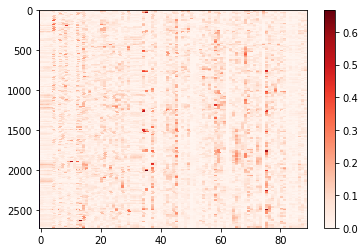

In [57]:
diff=np.array(diff,dtype=float)
plt.imshow(np.abs(diff), aspect='auto')
c=plt.pcolor(np.abs(diff),cmap='Reds')
plt.colorbar(c)
plt.savefig("diff.png")
plt.show()

In [74]:
np.savetxt("reconstruct.csv",new_data,delimiter=',', fmt='%f')

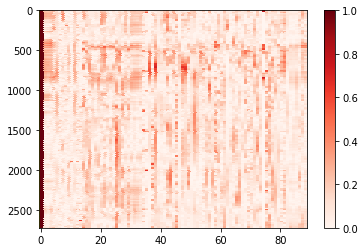

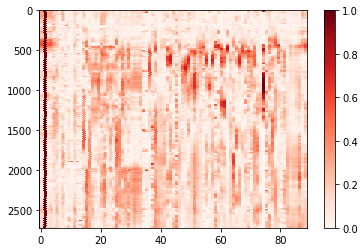

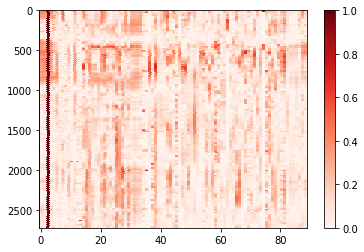

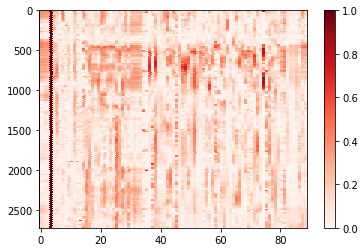

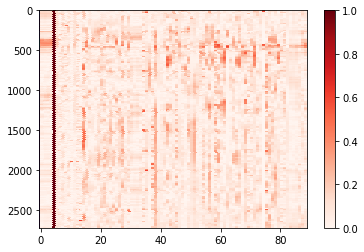

...

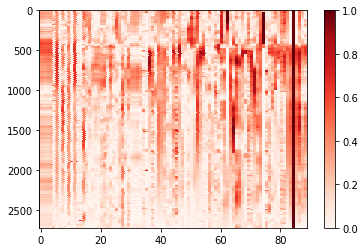

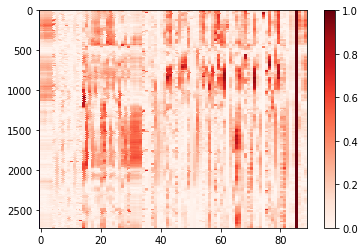

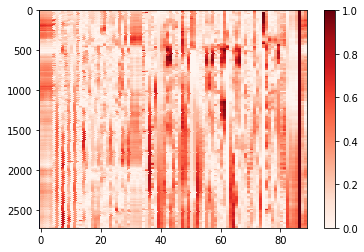

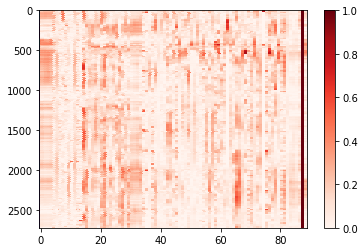

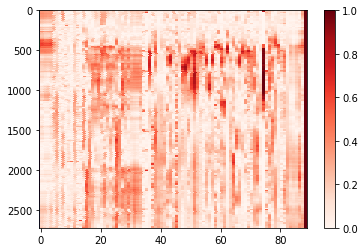

In [79]:
Container=[]
#noise=np.random.uniform(1,2,data.shape[0])
noise=np.ones(data.shape[0])*10
for i in range(data.shape[1]):
    re=[]
    noise_data=np.array(data)
    noise_data[:,i]=noise
    _n=torch.Tensor(noise_data)
    n_dataset=Data.TensorDataset(_n,_n)
    noise_loader=Data.DataLoader(dataset=n_dataset,batch_size=1,shuffle=False)
    for x,_ in noise_loader:
        x=x.view(x.size(0),-1)
        x=Variable(x)
        encoded,decoded=model(x)
        tmp=[]
        for x in decoded[0]:
            tmp.append(x)
        re.append(tmp)
    re=np.array(re)
    d=re-raw
    d[:,i]=np.ones(data.shape[0])
    d=np.array(d,dtype=float)
    plt.imshow(np.abs(d), aspect='auto')
    c1=plt.pcolor(np.abs(d),cmap='Reds')
    plt.colorbar(c1)
    plt.savefig("diff"+str(i)+".png")
    plt.show()
    Container.append(d)
#for i in range(data.shape[1]):
#    print(i)

In [76]:
np.savetxt("d.csv",d,delimiter=',', fmt='%f')